# 1. Pre-EDA Data Preparation

In [1]:
##################
## Read in Data ##
##################

# import dependencies
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt # visualizations
import re # regex
import string # handle string
import math # perform mathematical operations
import nltk

# load & format data
# data file used here is on google drive (not on github because file size is too large)
# contains both cleaned text columns and their original contents
df_cleantext = pd.read_csv("C:\\Users\\20jam\\Documents\\GitHub\\omdena-singapore-covid-health\\src\\data\\reddit\\fulldata_clean.csv")
df = df_cleantext[["id", "subreddit", "title", "clean_title", "score", "selftext", "clean_selftext", "upvote_ratio", "created_utc"]]
df = df.replace(np.nan, "", regex = True) # empty selftext

# merge clean_title + clean_selftext && title + selftext
text = [] # the cleaned text data
for rowIndex, row in df.iterrows():
    content = str(row["clean_title"]) + " " + str(row["clean_selftext"])
    text.append(content)
df["text"] = text
original_text = []
for rowIndex, row in df.iterrows():
    content = str(row["title"]) + ". " + str(row["selftext"])
    original_text.append(content)
df["original_text"] = original_text

df = df.drop(["clean_selftext", "selftext", "clean_title", "title"], axis = "columns")
# df.head()

In [2]:
######################
## Filter out Noise ##
######################

# remove non english words, abbreviations incomprehensible words
import nltk
nltk.download('words')
words = set(nltk.corpus.words.words())
for rowIndex, row in df.iterrows():
    try:
        string = row["text"]
        new_string = " ".join(w for w in nltk.wordpunct_tokenize(string) if w.lower() in words or not w.isalpha())
        df.loc[rowIndex, "text"] = new_string
    except:
        df.loc[rowIndex, "text"] = ""

# keep only noun (N)
import nltk
subject = []
def get_subject(txt):
    matter =  " ".join([word for (word, pos) in nltk.pos_tag(nltk.word_tokenize(txt)) if pos[0] in ["N"]])
    subject.append(matter)
for rowIndex, row in df.iterrows():
    get_subject(row["text"])
# print(len(subject))
# print(subject)
df["clean subject matter"] = subject

"""
# remove any additional words manually (edit this accordingly to rm words you see in wordcloud but do not want in)
filter = ["get", "go", "going", "got", "hi", "know", "feel", "like", "would", "know", "get", "really", "take", "keep", "find", "remember", "make", "try", "let"]3
def rm_words(txt):
    return " ".join([word for word in nltk.word_tokenize(txt) if word not in filter])
for rowIndex, row in df.iterrows():
    df.loc[rowIndex, "clean subject matter"] = rm_words(row["clean subject matter"])
"""

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\20jam\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


'\n# remove any additional words manually (edit this accordingly to rm words you see in wordcloud but do not want in)\nfilter = ["get", "go", "going", "got", "hi", "know", "feel", "like", "would", "know", "get", "really", "take", "keep", "find", "remember", "make", "try", "let"]3\ndef rm_words(txt):\n    return " ".join([word for word in nltk.word_tokenize(txt) if word not in filter])\nfor rowIndex, row in df.iterrows():\n    df.loc[rowIndex, "clean subject matter"] = rm_words(row["clean subject matter"])\n'

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\20jam\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


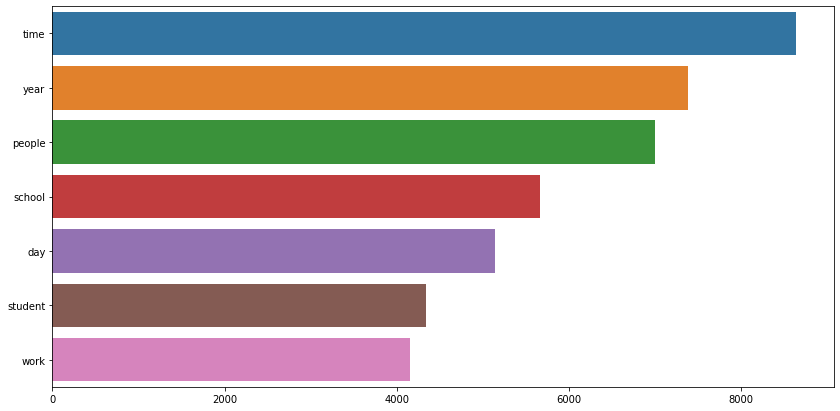

In [3]:
####################################
## Check for more Irrelevant Term ##
####################################

# add more words into "filter" in previous cell where relevant
# freq barplot for type of words used - noun, adj, verb etc.
from collections import Counter
from nltk.tokenize import word_tokenize
#nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
import spacy
nlp = spacy.load("en_core_web_sm")
from spacy import displacy
import seaborn as sns

"""
# we will only have N & V
def pos(text):
    pos = nltk.pos_tag(word_tokenize(text))
    pos = list(map(list,zip(*pos)))[1]
    return pos
tags = df['text'].apply(lambda x : pos(x))
tags = [x for l in tags for x in l]
counter = Counter(tags)
x,y = list(map(list,zip(*counter.most_common(7))))
sns.barplot(x = y,y = x)
"""
"""
# most commonly used -
def get_adjs(text, type_tag): # tag = "NN" noun, "JJ" adjectives, 
    adj = []
    pos = nltk.pos_tag(word_tokenize(text))
    for word, tag in pos:
        if tag == type_tag:
            adj.append(word)
    return adj
fig, axs = plt.subplots(figsize = (14,7))
words = df["clean subject matter"].apply(lambda x : get_adjs(x, type_tag = "NN"))
"""
plt.figure(figsize = (14,7))
words = df[df["clean subject matter"] != ""]
words = [word for xIndex, x in words.iterrows() for word in x["clean subject matter"].split()]
counter = Counter(words)
x,y = list(map(list,zip(*counter.most_common(7))))
sns.barplot(x = y,y = x)

In [4]:
#################
## Format Data ##
#################

text_df = df[["subreddit", "text", "original_text"]]
df_grouped = text_df.groupby(by = 'subreddit').agg(lambda x: x.str.cat(sep = " "))
# print(df_grouped)

# create document term matrix
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(analyzer = 'word')
data = cv.fit_transform(df_grouped['text'])
df_dtm = pd.DataFrame(data.toarray(), columns = cv.get_feature_names())
df_dtm.index = df_grouped.index
# df_dtm.head()

In [5]:
#########################
## Remove Invalid Data ##
#########################

# permanently remove rows with empty clean_selftext
# remove rows without useful information
df = df[df["text"] != ""]
df = df[df["clean subject matter"] != ""]
df

,id,subreddit,score,upvote_ratio,created_utc,text,original_text,clean subject matter
0,nhxjoa,singapore,117,0.96,2021-05-22,spore psychotic disorder say study,"About 71,600 in S'pore have psychotic disorder...",disorder study
1,ng6k8b,askSingapore,8,0.84,2021-05-19,anyone know get tested adult auditory disorder...,Anyone know where to get tested as an Adult fo...,anyone adult disorder child college age extrem...
2,ksalf9,singapore,202,0.94,2021-01-07,she even time grieve donor ask mum refund boy ...,'She didn't even have time to grieve': Some do...,time donor ask mum refund disorder
3,mfnwal,NationalServiceSG,5,0.86,2021-03-29,help adjustment disorder people say half war r...,Help for adjustment disorder. People say half ...,help adjustment disorder people war report ill...
4,l0ac4u,askSingapore,42,1.00,2021-01-19,get assessed eating disorder might eating diso...,Where to get assessed for eating disorders?. I...,disorder habit guess seed doubt head food lot ...
...,...,...,...,...,...,...,...,...
18312,b0hzfi,singapore,7,0.71,2019-03-13,influenza vaccine different brand vaccine avai...,Influenza Vaccine. Are there different brands ...,vaccine brand vaccine difference friend claim ...
18313,axxk5x,singapore,126,0.97,2019-03-06,parliament free cervical cancer vaccine female...,Parliament: Free opt-in cervical cancer vaccin...,cancer vaccine female sec student year
18314,ap5vn0,singapore,1,0.73,2019-02-10,lady vaccination yn experience cost clinic cur...,"[ladies] HPV vaccination - y/n, experience, co...",vaccination yn experience cost clinic chose cl...
18315,blzm57,singapore,152,0.98,2019-05-08,sec girl opt free cervical cancer vaccine,93% of Sec 1 girls opt for free cervical cance...,girl cancer vaccine


# 2. Ngram Analysis

"\n# alternative way to display most commonly used single words\ncorpus = []\nnew = df['clean_selftext'].str.split()\nnew = new.values.tolist()\nfor i in new:\n    if type(i) == list:\n        for word in i:\n                corpus.append(word)\n\nfrom collections import Counter\ncounter = Counter(corpus)\nmost = counter.most_common()\nx, y= [], []\nfor word, count in most[:40]:\n    x.append(word)\n    y.append(count)\n    \nsns.barplot(x = y, y = x)\n"

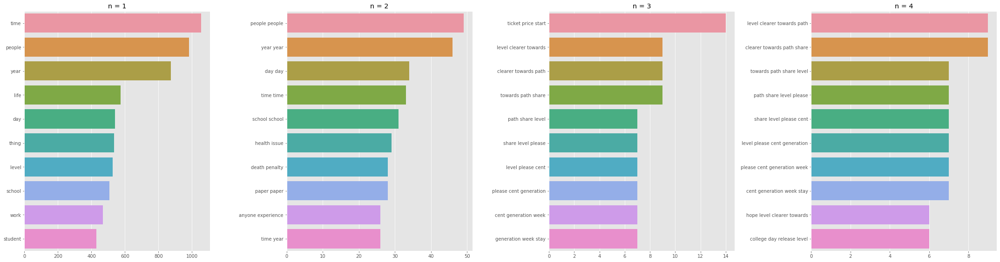

In [102]:
########################################
## ngram analysis for pre-covid posts ##
########################################

import datetime
import seaborn as sns
def get_top_ngram(corpus, n = None):
    vec = CountVectorizer(ngram_range = (n, n)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis = 0) 
    words_freq = [(word, sum_words[0, idx]) 
                  for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse = True)
    return words_freq[:10]

input = df.dropna(subset = ["clean subject matter"])
pre = input[input["created_utc"] < "2020-01-01"]
fig, axs = plt.subplots(ncols = 4, figsize = (30, 8))
top_n_bigrams = get_top_ngram(pre["clean subject matter"], 1)
x,y = map(list, zip(*top_n_bigrams)) 
sns.barplot(x = y, y = x, ax = axs[0])
top_n_bigrams = get_top_ngram(pre["clean subject matter"], 2)
x,y = map(list, zip(*top_n_bigrams)) 
sns.barplot(x = y, y = x, ax = axs[1])
top_tri_grams=get_top_ngram(pre["clean subject matter"], n = 3)
x,y = map(list, zip(*top_tri_grams))
sns.barplot(x = y, y = x, ax = axs[2])
top_quad_grams=get_top_ngram(pre["clean subject matter"], n = 4)
x,y = map(list, zip(*top_quad_grams))
sns.barplot(x = y, y = x, ax = axs[3])

axs[0].set_title("n = 1")
axs[1].set_title("n = 2")
axs[2].set_title("n = 3")
axs[3].set_title("n = 4")
fig.tight_layout(pad = 1.3)
fig.savefig("ngram precovid.png")

"""
# alternative way to display most commonly used single words
corpus = []
new = df['clean_selftext'].str.split()
new = new.values.tolist()
for i in new:
    if type(i) == list:
        for word in i:
                corpus.append(word)

from collections import Counter
counter = Counter(corpus)
most = counter.most_common()
x, y= [], []
for word, count in most[:40]:
    x.append(word)
    y.append(count)
    
sns.barplot(x = y, y = x)
"""

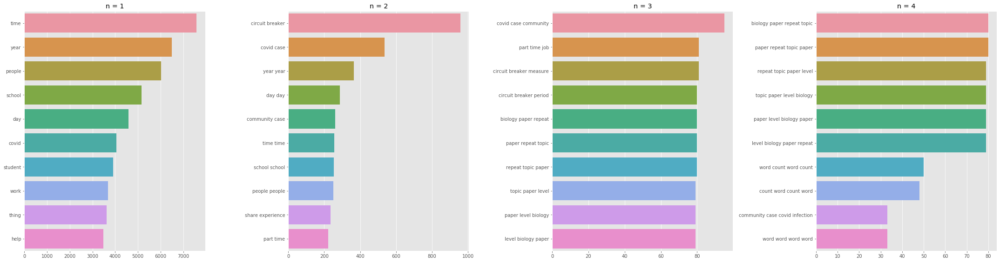

In [103]:
########################################
## ngram analysis for mid-covid posts ##
########################################

input = df.dropna(subset = ["clean subject matter"])
mid = input[input["created_utc"] > "2020-01-01"]
fig, axs = plt.subplots(ncols = 4, figsize = (30, 8))
top_n_bigrams = get_top_ngram(mid["clean subject matter"], 1)
x,y = map(list, zip(*top_n_bigrams)) 
sns.barplot(x = y, y = x, ax = axs[0])
top_n_bigrams = get_top_ngram(mid["clean subject matter"], 2)
x,y = map(list, zip(*top_n_bigrams)) 
sns.barplot(x = y, y = x, ax = axs[1])
top_tri_grams=get_top_ngram(mid["clean subject matter"], n = 3)
x,y = map(list, zip(*top_tri_grams))
sns.barplot(x = y, y = x, ax = axs[2])
top_quad_grams=get_top_ngram(mid["clean subject matter"], n = 4)
x,y = map(list, zip(*top_quad_grams))
sns.barplot(x = y, y = x, ax = axs[3])

axs[0].set_title("n = 1")
axs[1].set_title("n = 2")
axs[2].set_title("n = 3")
axs[3].set_title("n = 4")
fig.tight_layout(pad = 1.3)
fig.savefig("ngram midcovid.png")

In [ ]:
#############################################################
## LDA to Probe Topic related to Features in Ngrams (help) ##
#############################################################

nltk.download("")
trial = df[df["clean subject matter"].str.contains("help")]
text_data = []
for rowIndex, row in trial.iterrows():
    text_data.append(row["clean subject matter"].split())

from gensim import corpora
dictionary = corpora.Dictionary(text_data)
corpus = [dictionary.doc2bow(text) for text in text_data]
import pickle
pickle.dump(corpus, open('corpus.pkl', 'wb'))
dictionary.save('dictionary.gensim')

import gensim
NUM_TOPICS = 3
ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics = NUM_TOPICS, id2word=dictionary, passes=15)
ldamodel.save('model5.gensim')
topics = ldamodel.print_topics(num_words=4)
for topic in topics:
    print(topic)

dictionary = gensim.corpora.Dictionary.load('dictionary.gensim')
corpus = pickle.load(open('corpus.pkl', 'rb'))
lda = gensim.models.ldamodel.LdaModel.load('model5.gensim')

import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
lda_display = gensimvis.prepare(lda, corpus, dictionary, sort_topics=False)
pyLDAvis.save_html(lda_display, "lda_help.html")
pyLDAvis.display(lda_display)

C:\Users\20jam\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\20jam\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
C:\Users\20jam\AppData\Local\Programs\Python\Python37\lib\site-packages\pandas\core\frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


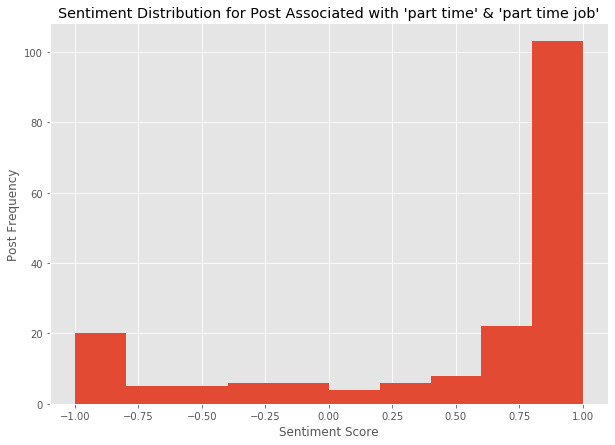

In [55]:
#################################
## Probe sentiment (part time) ##
#################################

import numpy as np
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
sentiment = SentimentIntensityAnalyzer()
trial = df[df["clean subject matter"].str.contains("part time | part time jobs")]
trial['sentiment score'] = trial["text"].apply(lambda x: sentiment.polarity_scores(x))
trial["sentiment score"] = trial["sentiment score"].apply(pd.Series)["compound"]
plt.figure(figsize = (10,7))
plt.style.use("ggplot")
plt.title("Sentiment Distribution for Post Associated with 'part time' & 'part time job'")
plt.xlabel("Sentiment Score")
plt.ylabel("Post Frequency")
plt.hist(trial["sentiment score"])
plt.savefig("Sentiment Distribution for Post Associated with 'part time' and 'part time job'")

# 3. WordCloud

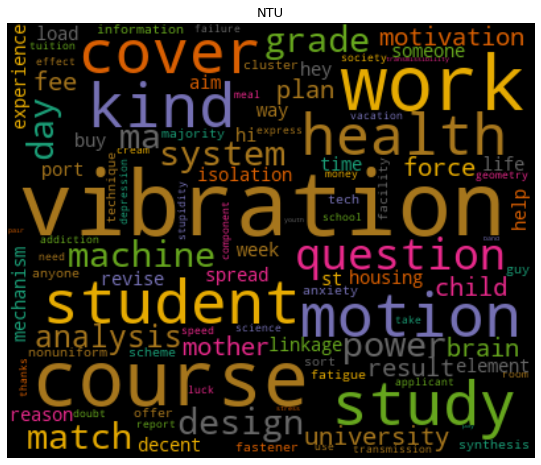

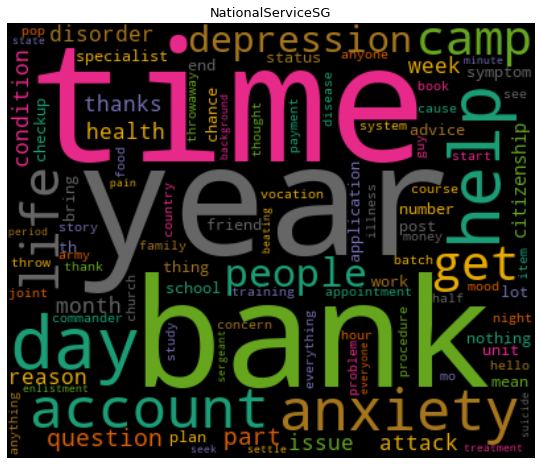

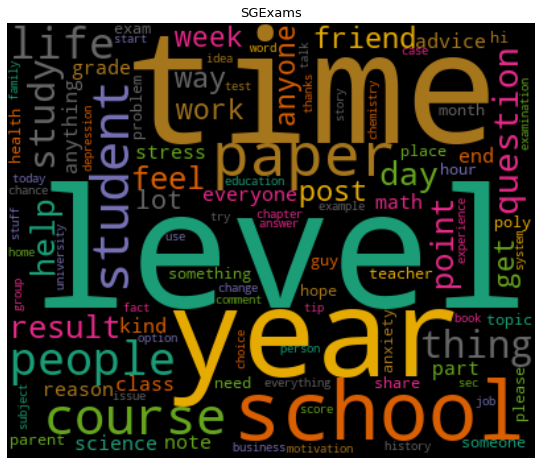

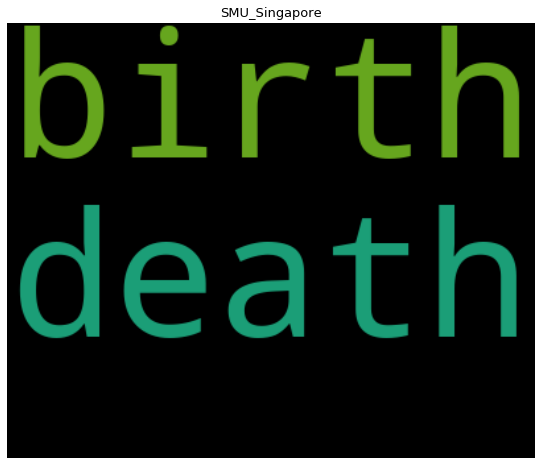

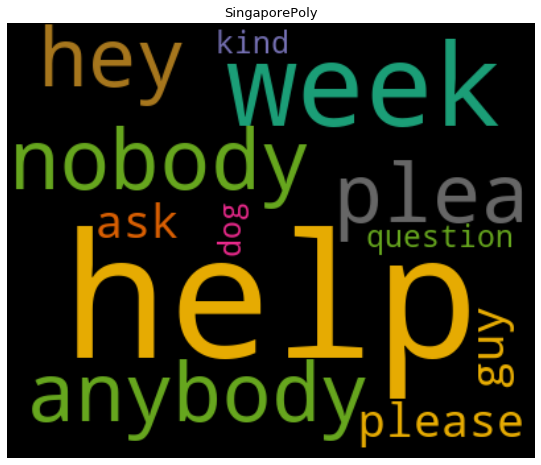

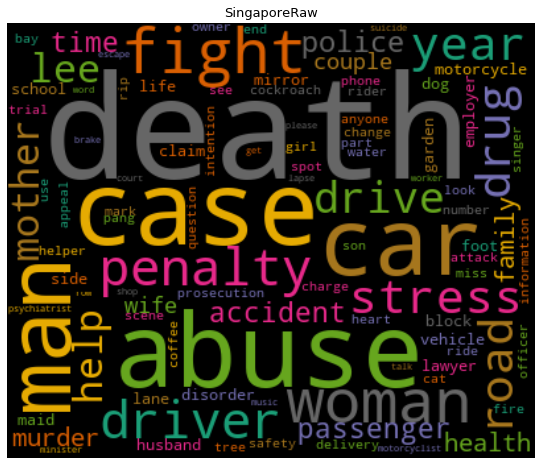

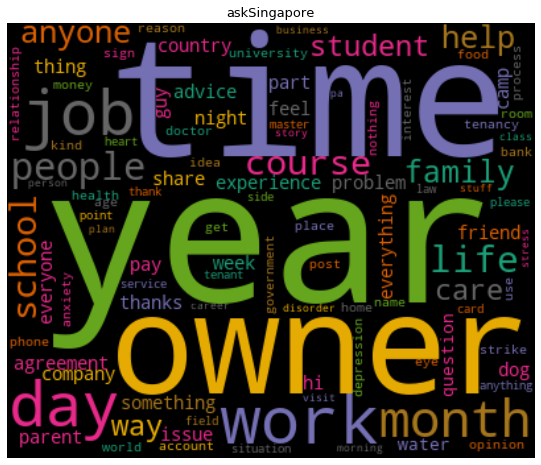

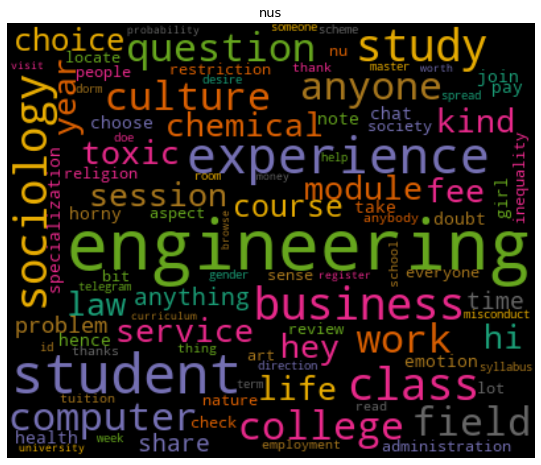

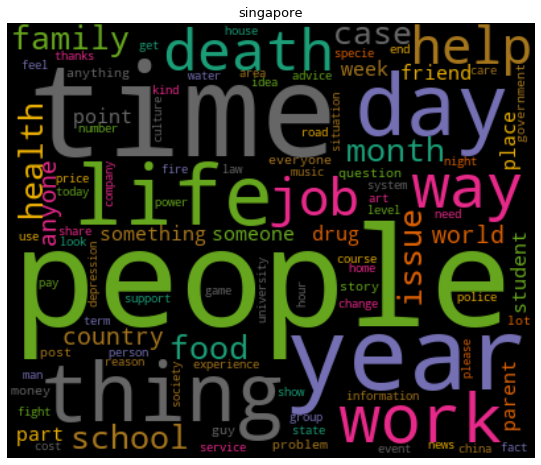

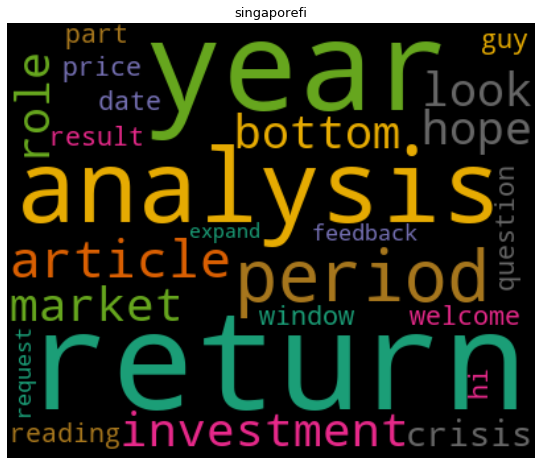

In [104]:
#######################################################
## Word Clouds for Individual Subreddit before Covid ##
#######################################################

# pre-covid
pre_subject = df[df["created_utc"] < "2020-01-01"]
text_df = pre_subject[["subreddit", "clean subject matter"]]
df_grouped = text_df.groupby(by = 'subreddit').agg(lambda x: x.str.cat(sep = " "))

# create document term matrix
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(analyzer = "word")
data = cv.fit_transform(df_grouped["clean subject matter"])
df_dtm = pd.DataFrame(data.toarray(), columns = cv.get_feature_names())
df_dtm.index = df_grouped.index

# generate wordcloud
from wordcloud import WordCloud
from textwrap import wrap

def generate_wordcloud(data,title):
  wc = WordCloud(width = 400, height = 330, max_words = 100, colormap = "Dark2").generate_from_frequencies(data)
  plt.figure(figsize = (10,8))
  plt.imshow(wc, interpolation = 'bilinear')
  plt.axis("off")
  plt.savefig("{} wordcloud precovid.png".format(title))
  plt.title('\n'.join(wrap(title,60)), fontsize = 13)
  plt.show()
  
# transpose document term matrix
df_dtm = df_dtm.transpose()

# plotting word cloud for subreddit
for index, product in enumerate(df_dtm.columns):
  generate_wordcloud(df_dtm[product].sort_values(ascending = False), product)

In [8]:
################################################
## Limited Number of Post in these Subreddits ##
################################################

# df[df["subreddit"] == "SMU_Singapore"]
# df[df["subreddit"] == "SingaporePoly"]

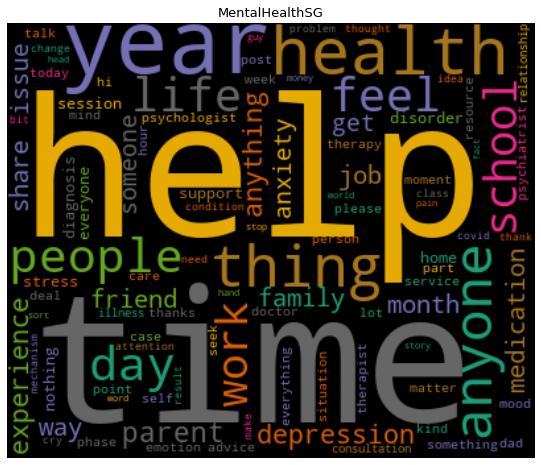

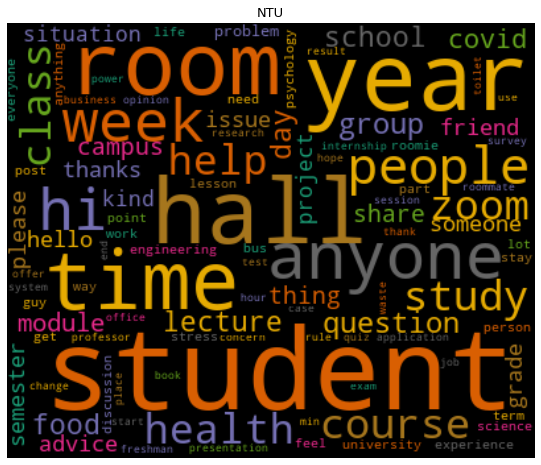

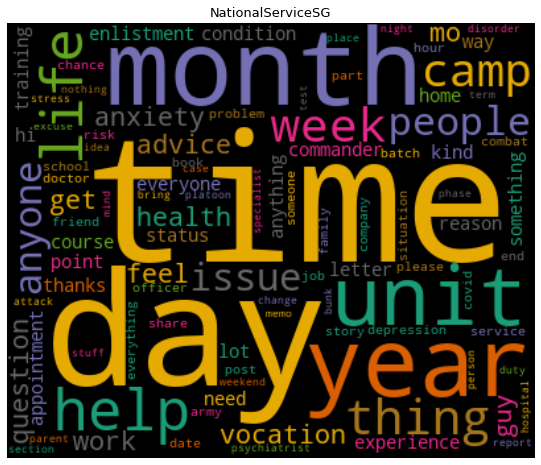

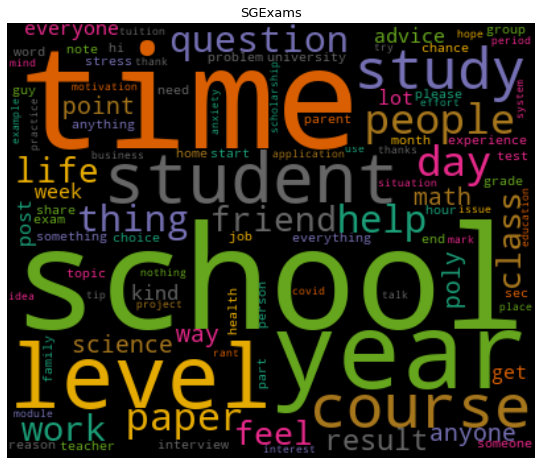

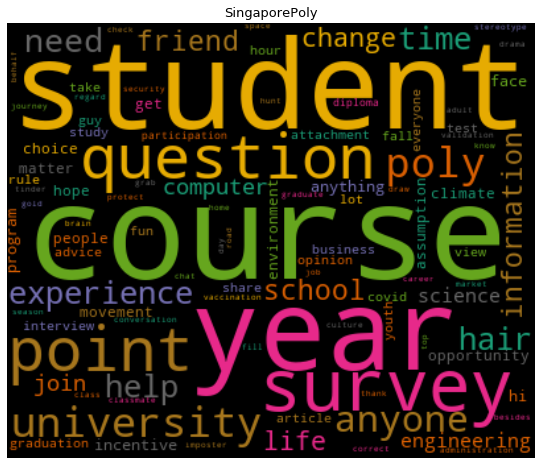

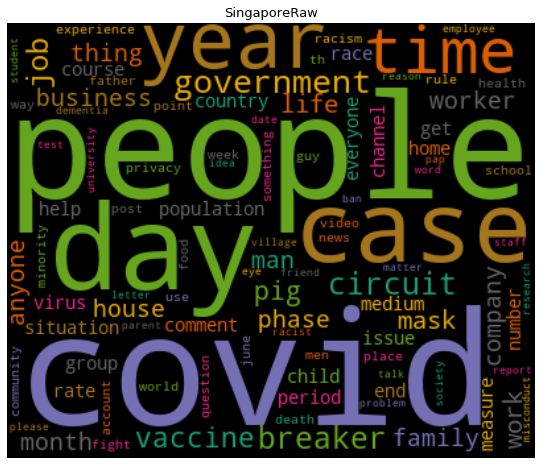

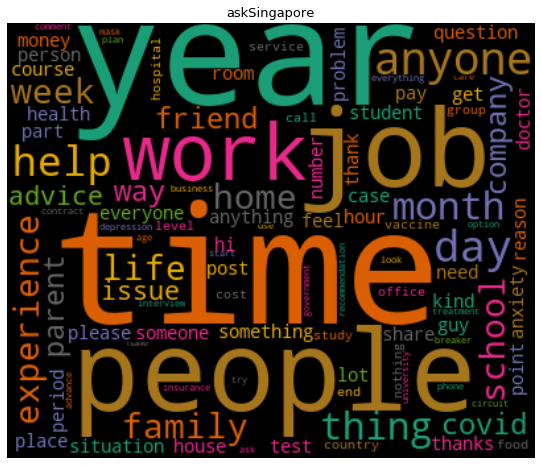

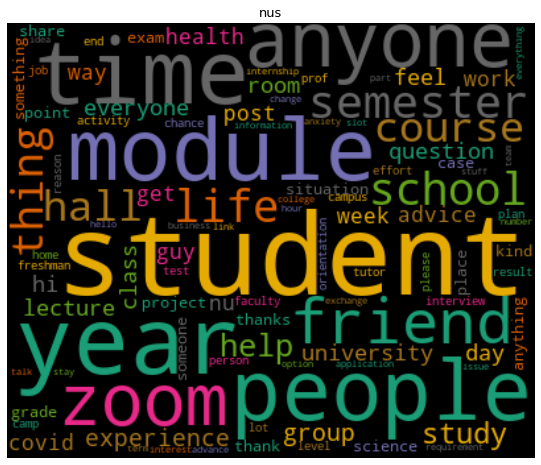

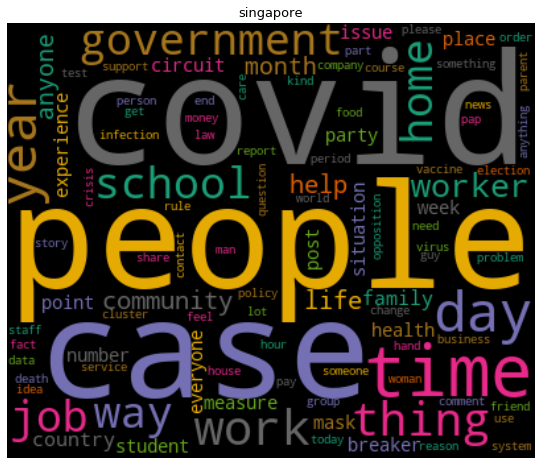

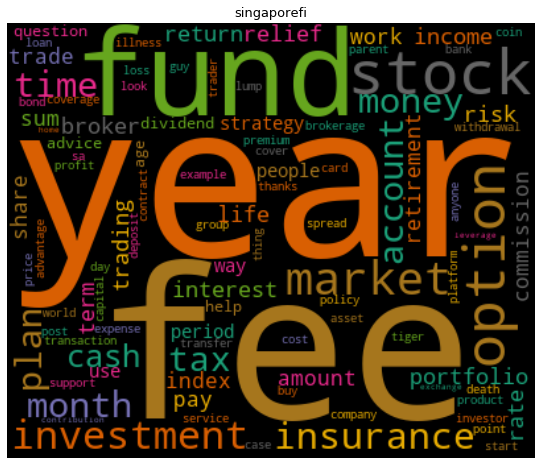

In [105]:
#######################################################
## Word Clouds for Individual Subreddit during Covid ##
#######################################################

# mid-covid
mid_subject = df[df["created_utc"] > "2020-01-01"]
text_df = mid_subject[["subreddit", "clean subject matter"]]
df_grouped = text_df.groupby(by = "subreddit").agg(lambda x: x.str.cat(sep = " "))

# create document term matrix
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(analyzer = "word")
data = cv.fit_transform(df_grouped["clean subject matter"])
df_dtm = pd.DataFrame(data.toarray(), columns = cv.get_feature_names())
df_dtm.index = df_grouped.index

# generate wordcloud
from wordcloud import WordCloud
from textwrap import wrap

def generate_wordcloud(data,title):
  wc = WordCloud(width = 400, height = 330, max_words = 100, colormap = "Dark2").generate_from_frequencies(data)
  plt.figure(figsize = (10,8))
  plt.imshow(wc, interpolation = 'bilinear')
  plt.axis("off")
  plt.savefig("{} wordcloud midcovid.png".format(title))
  plt.title('\n'.join(wrap(title,60)), fontsize = 13)
  plt.show()
  
# transpose document term matrix
df_dtm = df_dtm.transpose()

# plotting word cloud for subreddit
for index,product in enumerate(df_dtm.columns):
  generate_wordcloud(df_dtm[product].sort_values(ascending = False), product)

# 4. Sentiment Polarity Analysis

In [106]:
##################################
## Calculate Sentiment Polarity ##
##################################

import numpy as np
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
sentiment = SentimentIntensityAnalyzer()
df['sentiment score'] = df["text"].apply(lambda x: sentiment.polarity_scores(x))
df["sentiment score"] = df["sentiment score"].apply(pd.Series)["compound"]
"""
from textblob import TextBlob
def polarity(text):
    try:
        return TextBlob(text).sentiment.polarity
    except:
        if type(text) == float:
            pass
"""

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\20jam\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


'\nfrom textblob import TextBlob\ndef polarity(text):\n    try:\n        return TextBlob(text).sentiment.polarity\n    except:\n        if type(text) == float:\n            pass\n'

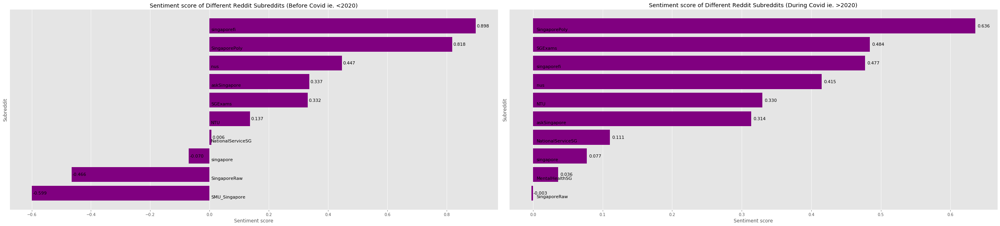

In [107]:
################################
## Subreddit Sentiment Scores ##
################################

# precovid stat calc
pre = df[df["created_utc"] < "2020-01-01"]
subreddit_sentiment_sorted=pd.DataFrame(pre.groupby('subreddit')['sentiment score'].mean().sort_values(ascending=True))
# plot setting
plt.style.use("ggplot")
plt.figure(figsize = (35,8))
plt.subplot(1, 2, 1)
plt.xlabel('Sentiment score')
plt.ylabel('Subreddit')
plt.title('Sentiment score of Different Reddit Subreddits (Before Covid ie. <2020)')
sentiment_graph=plt.barh(np.arange(len(subreddit_sentiment_sorted.index)),subreddit_sentiment_sorted['sentiment score'],color='purple',)
# writing names on bar
for bar,subreddit in zip(sentiment_graph,subreddit_sentiment_sorted.index):
  plt.text(0.005, bar.get_y() + 0.2,'{}'.format(subreddit),va='center',fontsize=11,color='black')
# writing sentiment values on graph
for bar,sentiment in zip(sentiment_graph,subreddit_sentiment_sorted['sentiment score']):
  plt.text(bar.get_width() + 0.003, bar.get_y() + 0.4,'%.3f'%sentiment,va='center', fontsize = 11, color = 'black')
plt.yticks([])

# midcovid stat calc
mid = df[df["created_utc"] > "2020-01-01"]
subreddit_sentiment_sorted=pd.DataFrame(mid.groupby('subreddit')['sentiment score'].mean().sort_values(ascending=True))
# plot setting
plt.subplot(1, 2, 2)
plt.xlabel('Sentiment score')
plt.ylabel('Subreddit')
plt.title('Sentiment score of Different Reddit Subreddits (During Covid ie. >2020)')
sentiment_graph=plt.barh(np.arange(len(subreddit_sentiment_sorted.index)),subreddit_sentiment_sorted['sentiment score'],color='purple',)
# writing names on bar
for bar,subreddit in zip(sentiment_graph,subreddit_sentiment_sorted.index):
  plt.text(0.005, bar.get_y() + 0.2,'{}'.format(subreddit),va='center',fontsize=11,color='black')
# writing sentiment values on graph
for bar,sentiment in zip(sentiment_graph,subreddit_sentiment_sorted['sentiment score']):
  plt.text(bar.get_width() + 0.003, bar.get_y() + 0.4,'%.3f'%sentiment,va='center', fontsize = 11, color = 'black')
plt.yticks([])
plt.tight_layout()
plt.savefig("Subreddit Sentiment Scores.png")
plt.show()

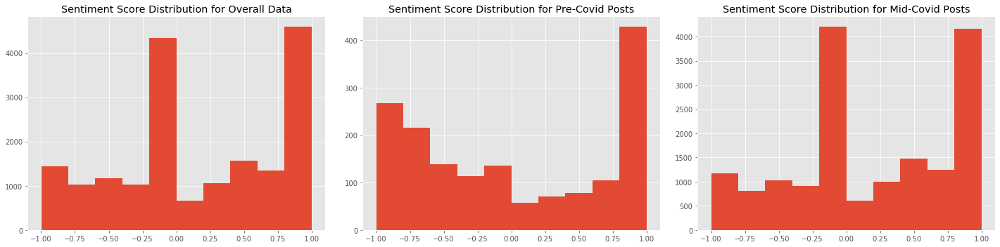

In [108]:
########################
## polarity histogram ##
#########################

# plot one by one
# polarity histogram (overall)
import pylab as pl
plt.style.use("ggplot")
plt.figure(figsize = (20,5))
plt.subplot(1, 3, 1)
n, bins, patches = plt.hist(df['sentiment score'])
plt.title("Sentiment Score Distribution for Overall Data")

# polarity histogram for pre-covid period
plt.subplot(1, 3, 2)
n, bins, patches = plt.hist(pre['sentiment score'])
plt.title("Sentiment Score Distribution for Pre-Covid Posts")

# polarity histogram for mid-covid period
plt.subplot(1, 3, 3)
n, bins, patches = plt.hist(mid['sentiment score'])
plt.title("Sentiment Score Distribution for Mid-Covid Posts")
plt.tight_layout()
plt.savefig("Polarity Histograms.png")

"\nalternative method:\n# sentiment analysis using vader\nfrom nltk.sentiment.vader import SentimentIntensityAnalyzer\nnltk.download('vader_lexicon')\nsid = SentimentIntensityAnalyzer()\n\ndef get_vader_score(sent):\n    # polarity score returns dictionary\n    ss = sid.polarity_scores(sent)\n    # return ss\n    return np.argmax(list(ss.values())[:-1])\n\ndf['polarity_t'] = input['clean_selftext'].    map(lambda x: get_vader_score(x))\npolarity = df['polarity_t'].replace({0:'neg',1:'neu',2:'pos'})\n\nplt.bar(polarity.value_counts().index,\n        polarity.value_counts())\n\n# display sample with negative sentiment\ndf[df['polarity_t']==2]['clean_selftext']\n"

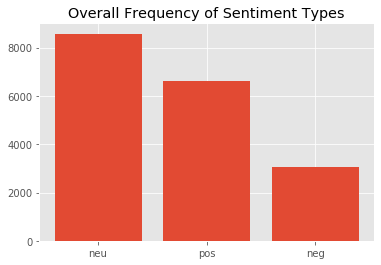

In [109]:
#####################################################
## Compare Frequency of Sentiment (using polarity) ##
#####################################################

def sentiment(x):
    if x < -0.5:
        return 'neg'
    elif x >= -0.5 and x <= 0.5:
        return 'neu'
    else:
        return 'pos'

df['sentiment class'] = df['sentiment score'].\
   map(lambda x: sentiment(x))
plt.bar(df['sentiment class'].value_counts().index,
        df['sentiment class'].value_counts())
plt.title("Overall Frequency of Sentiment Types")
plt.savefig("Frequency of Sentiment.png")

"""
alternative method:
# sentiment analysis using vader
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
sid = SentimentIntensityAnalyzer()

def get_vader_score(sent):
    # polarity score returns dictionary
    ss = sid.polarity_scores(sent)
    # return ss
    return np.argmax(list(ss.values())[:-1])

df['polarity_t'] = input['clean_selftext'].\
    map(lambda x: get_vader_score(x))
polarity = df['polarity_t'].replace({0:'neg',1:'neu',2:'pos'})

plt.bar(polarity.value_counts().index,
        polarity.value_counts())

# display sample with negative sentiment
df[df['polarity_t']==2]['clean_selftext']
"""

In [14]:
#####################################################
## Top 3 Post with Highest & Lowest Polarity Score ##
#####################################################

"""
# view top (from bottom and above) output of sentiment polarity analysis
print("Top 3 Most Positive Posts:")
for rowIndex, row in df.sort_values(by = ["sentiment score"], ascending = False).head(3).iterrows():
    content = " ".join(row["original_text"].split())
    print("POST INDEX {}: \n".format(rowIndex + 1), content)
    print()
print()
print()
print("Top 3 Most Negative Posts:")
for rowIndex, row in df.sort_values(by = ["sentiment score"], ascending = True).head(3).iterrows():
    content = " ".join(row["original_text"].split())
    print("POST INDEX {}: \n".format(rowIndex + 1), content)
    print()
"""
"""
Alternatively: 
print("Top 3 Most Positive Posts:")
for index, txt in enumerate(df.iloc[df['polarity'].sort_values(ascending = False)[:3].index]["selftext"]):
  print('Post {}:\n'.format(index + 1), txt)
print()
print("Top 3 Most Negative Posts:")
for index, txt in enumerate(df.iloc[df['polarity'].sort_values(ascending = True)[:3].index]["selftext"]):
  print('Post {}:\n'.format(index + 1),txt)
"""
"""
# display examples of negative sentiment instances
df[df['sentiment class']=='neg']['original_text'].head()
"""

"\n# display examples of negative sentiment instances\ndf[df['sentiment class']=='neg']['original_text'].head()\n"

In [110]:
###########################
## Sentiment across Time ##
###########################

import altair as alt
import pandas as pd
import vaderSentiment
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

def sentiment_scores(sentence):
    sentence['positive'] = 0
    sentence['negative'] = 0
    sentence['neutral'] = 0
    # Create a SentimentIntensityAnalyzer object.
    sid_obj = SentimentIntensityAnalyzer()
 
    # polarity_scores method of SentimentIntensityAnalyzer
    # object gives a sentiment dictionary.
    # which contains pos, neg, neu, and compound scores.
    sentiment_dict = sid_obj.polarity_scores(str(sentence['text']))
    sentence['positive_percentage'] = sentiment_dict['pos']*100
    sentence['negative_percentage'] = sentiment_dict['neg']*100
    sentence['neutral_percentage'] = sentiment_dict['neu']*100
     
    # decide sentiment as positive, negative and neutral
    if sentiment_dict['compound'] >= 0.05 :
        sentence['positive'] = 1
    elif sentiment_dict['compound'] <= - 0.05 :
        sentence['negative'] = 1
    else :
        sentence['neutral'] = 1
    return sentence

sentiment_analysis = df.apply(sentiment_scores, axis=1) 
sentiment_analysis_group = sentiment_analysis.groupby('created_utc')['positive', 'negative', 'neutral'].sum().reset_index()
sentiment_analysis_df = sentiment_analysis_group[['positive', 'negative', 'neutral', 'created_utc']].melt(id_vars='created_utc')
selection = alt.selection_multi(fields=['color'], bind='legend')
sentiment_trend = alt.Chart(sentiment_analysis_df, title='Overall Sentiment Analysis Trend').mark_line().encode(
        x=alt.X(
            "created_utc:T",
            axis=alt.Axis(title="created_utc")
        ),
        y='value',
        color='variable:N',
    ).properties(
        width=800,
        height=400
    ).configure_axisX(
        labelAngle=-45,
    ).interactive().add_selection(
        selection
    )
import selenium.webdriver
driver = selenium.webdriver.firefox
sentiment_trend.save("Sentiment Across Time.png", webdriver = "firefox")

C:\Users\20jam\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:35: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.


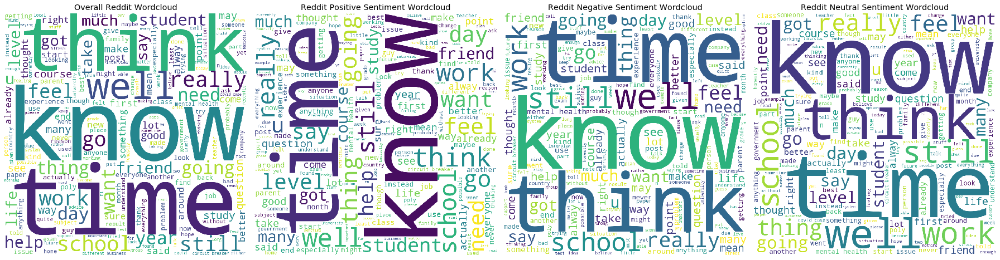

In [111]:
##################################################
## Further Analysis of Sentiment with WordCloud ##
##################################################

from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

comment_words = ''
stopwords = set(STOPWORDS)
stopwords.add('im')
stopwords.add('one')
stopwords.add('people')
stopwords.add('even')
 
# iterate through the csv file
for columns, details in df.iterrows():
    val = str(details['text'])
    tokens = val.split()
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
    comment_words += " ".join(tokens)+" "
word_cloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
# plot the WordCloud image
plt.style.use("ggplot")
plt.figure(figsize = (25,25), facecolor = None)
plt.subplot(1, 4, 1)                      
plt.imshow(word_cloud)
plt.title('Overall Reddit Wordcloud')
plt.axis("off")
plt.tight_layout()

# iterate through the csv file
for columns, details in sentiment_analysis[sentiment_analysis['positive']==1].iterrows():
    val = str(details['text'])
    tokens = val.split()
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
    comment_words += " ".join(tokens)+" "
word_cloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
# plot the WordCloud image
plt.subplot(1, 4, 2)                      
plt.imshow(word_cloud)
plt.title('Reddit Positive Sentiment Wordcloud')
plt.axis("off")
plt.tight_layout()
 
# iterate through the csv file
for columns, details in sentiment_analysis[sentiment_analysis['negative']==1].iterrows():
    val = str(details['text'])
    tokens = val.split()
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
    comment_words += " ".join(tokens)+" "
word_cloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
# plot the WordCloud image                      
plt.subplot(1, 4, 3)                      
plt.imshow(word_cloud)
plt.title('Reddit Negative Sentiment Wordcloud')
plt.axis("off")
plt.tight_layout()
 
# iterate through the csv file
for columns, details in sentiment_analysis[sentiment_analysis['neutral']==1].iterrows():
    val = str(details['text'])
    tokens = val.split()
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
    comment_words += " ".join(tokens)+" "
word_cloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)
# plot the WordCloud image                      
plt.subplot(1, 4, 4)                      
plt.imshow(word_cloud)
plt.title('Reddit Neutral Sentiment Wordcloud')
plt.axis("off")
plt.tight_layout()
plt.savefig("Commonly Used XX Words")

# 5. Frquency of Post over Time

In [112]:
###########################################
## Frquency of Post over Time (by Month) ##
###########################################

"""
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
dates = mdates.datestr2num(df["created_utc"].tolist())
fig, ax = plt.subplots(1,1)
locator = mdates.AutoDateLocator()
ax.xaxis.set_major_locator(locator)
ax.hist(dates, bins=50, color='purple')
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.AutoDateFormatter(locator))
plt.show()
"""
df = df.reset_index()
date_count = df.groupby('created_utc')['created_utc'].count().to_frame()
date_count = date_count.rename(columns={'created_utc': 'count'})
date_count = date_count.reset_index()

alt.renderers.enable('default') 
selection = alt.selection_multi(fields=['count'], bind='legend')
trend = alt.Chart(date_count, title="Reddit Overall Trend").mark_line().encode(
    x=alt.X(
        "created_utc:T",
        axis=alt.Axis(title="created_utc")
    ),
    y='count',
).properties(
    width=800,
    height=400
).configure_axisX(
    labelAngle=-45,
).interactive().add_selection(
    selection
)
import selenium.webdriver
driver = selenium.webdriver.firefox
trend.save("Post Frequency Across Time.png", webdriver = "firefox")

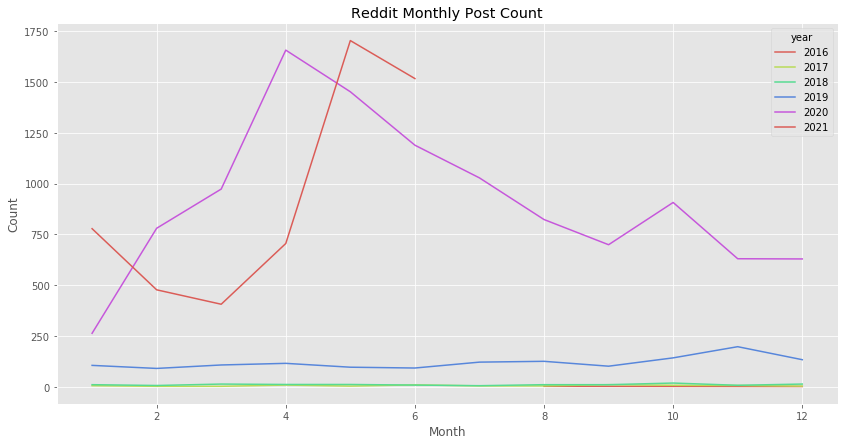

In [115]:
##########################################
## Frquency of Post over Time (by Year) ##
##########################################

"""
df['created_utc'] = df['created_utc'].astype('datetime64[ns]')
year_count = df.groupby(df['created_utc'].dt.year).size().reset_index()
year_count = year_count.rename(columns={0:'count'})
fig_1 = plt.figure(figsize=(14, 7))
ax1 = sns.barplot(x="created_utc", y="count", data=year_count, ci = None, color='#5499c7')
ax1.set_title('Reddit Yearly Posts Count')
ax1.set(xlabel='Year', ylabel='Count')
"""

'Start Date', min(df['created_utc'])
'End Date', max(df['created_utc'])
df['created_utc'] = df['created_utc'].astype('datetime64[ns]')
df['month'] = df['created_utc'].dt.month
df['year'] = df['created_utc'].dt.year
df['day'] = df['created_utc'].dt.day_name()
df['day_number'] = df['created_utc'].dt.dayofweek
monthly_count = df.groupby([df['year'], df['month']]).size().reset_index()
monthly_count = monthly_count.rename(columns={0:'count'})

fig = plt.figure(figsize=(14,7))
ax = sns.lineplot(x="month", y="count", data=monthly_count,  hue="year", palette = 'hls') 
ax.set_title('Reddit Monthly Post Count')
ax.set(xlabel='Month', ylabel='Count')
plt.savefig("Reddit Montly Post Count.png")

'\n# alternative\nfig_1 = plt.figure(figsize=(20, 6))\nax1 = sns.barplot(x="day", y="count", data=before_pandemic_day_count, ci = None, color=\'#5499c7\')\nax1.set_title(\'Day of Week Post Count Before Pandemic\')\nax1.set(xlabel=\'Day of Week\', ylabel=\'Count\')  \n\nfig_1 = plt.figure(figsize=(20, 6))\nax1 = sns.barplot(x="day", y="count", data=pandemic_day_count, ci = None, color=\'#5499c7\')\nax1.set_title(\'Day of Week Post Count During Pandemic\')\nax1.set(xlabel=\'Day of Week\', ylabel=\'Count\')  \n'

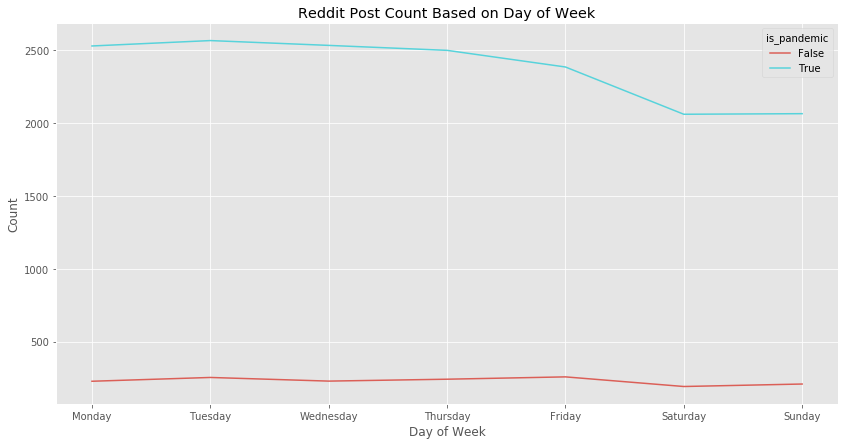

In [116]:
#########################################
## Frquency of Post over Time (by Day) ##
#########################################

before_pandemic_day_count = df[df['year']<2020].groupby([df['day_number'], df['day']]).size().reset_index()
before_pandemic_day_count = before_pandemic_day_count.rename(columns={0:'count'})
before_pandemic_day_count['is_pandemic'] = False

pandemic_day_count = df[df['year']>2019].groupby([df['day_number'], df['day']]).size().reset_index()
pandemic_day_count = pandemic_day_count.rename(columns={0:'count'})
pandemic_day_count['is_pandemic'] = True

overall_day_trend = pd.concat([before_pandemic_day_count, pandemic_day_count])
fig = plt.figure(figsize=(14,7))
ax = sns.lineplot(x="day", y="count", data=overall_day_trend,  hue="is_pandemic", palette = 'hls') 
ax.set_title('Reddit Post Count Based on Day of Week')
ax.set(xlabel='Day of Week', ylabel='Count')
plt.savefig("Reddit Post Count Based on Day of Week.png")
"""
# alternative
fig_1 = plt.figure(figsize=(20, 6))
ax1 = sns.barplot(x="day", y="count", data=before_pandemic_day_count, ci = None, color='#5499c7')
ax1.set_title('Day of Week Post Count Before Pandemic')
ax1.set(xlabel='Day of Week', ylabel='Count')  

fig_1 = plt.figure(figsize=(20, 6))
ax1 = sns.barplot(x="day", y="count", data=pandemic_day_count, ci = None, color='#5499c7')
ax1.set_title('Day of Week Post Count During Pandemic')
ax1.set(xlabel='Day of Week', ylabel='Count')  
"""

In [117]:
#############################################
## Frequency of Post for Specfic Subreddit ##
#############################################

# note that mentalhealthsg is created only Jun 3, 2020
"""
mentalhealth = df[df["subreddit"] == "MentalHealthSG"]
dates = mentalhealth["created_utc"].tolist()
dates = mdates.datestr2num(mentalhealth["created_utc"].tolist())
fig, ax = plt.subplots(1,1)
locator = mdates.AutoDateLocator()
ax.xaxis.set_major_locator(locator)
ax.hist(dates, bins=50, color='purple')
# ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.AutoDateFormatter(locator))
"""

date_count = df[df["subreddit"] == "MentalHealthSG"]
date_count = date_count.groupby('created_utc')['created_utc'].count().to_frame()
date_count = date_count.rename(columns={'created_utc': 'count'})
date_count = date_count.reset_index()

alt.renderers.enable('default') 
selection = alt.selection_multi(fields=['count'], bind='legend')
trend = alt.Chart(date_count, title="MentalHealthSG Subreddit Overall Trend").mark_line().encode(
    x=alt.X(
        "created_utc:T",
        axis=alt.Axis(title="created_utc")
    ),
    y='count',
).properties(
    width=800,
    height=400
).configure_axisX(
    labelAngle=-45,
).interactive().add_selection(
    selection
)
import selenium.webdriver
driver = selenium.webdriver.firefox
trend.save("MentalHealthSG Post Frequency Across Time.png", webdriver = "firefox")

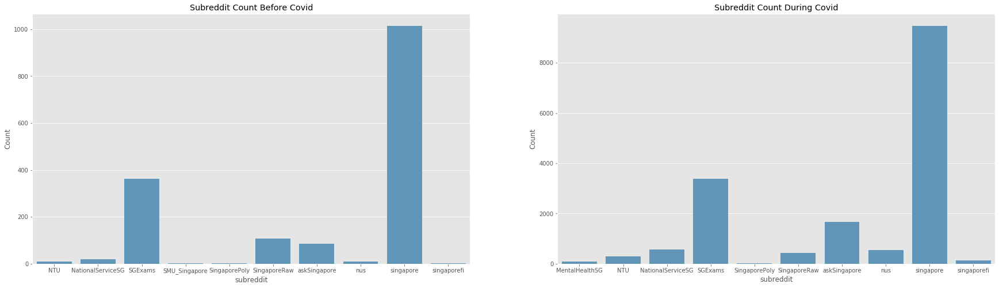

In [118]:
####################################
## Frequency of Post by Subreddit ##
####################################

plt.style.use("ggplot")
plt.figure(figsize = (30,8))
plt.subplot(1, 2, 1)
subreddit = pre.groupby('subreddit').size().reset_index()
subreddit = subreddit.rename(columns={0:'count'})
ax1 = sns.barplot(x="subreddit", y="count", data=subreddit, ci = None, color='#5499c7')
ax1.set_title('Subreddit Count Before Covid')
ax1.set(xlabel='subreddit', ylabel='Count')  

plt.subplot(1, 2, 2)
subreddit = mid.groupby('subreddit').size().reset_index()
subreddit = subreddit.rename(columns={0:'count'})
ax1 = sns.barplot(x="subreddit", y="count", data=subreddit, ci = None, color='#5499c7')
ax1.set_title('Subreddit Count During Covid')
ax1.set(xlabel='subreddit', ylabel='Count') 
plt.savefig("Subreddit Post Count Before and After Covid.png")

# 6. Empath Analysis

In [7]:
# calculate empath
import empath
from empath import Empath
lexicon = Empath()
def empath_analysis(text):
    analysis = lexicon.analyze(text, normalize = True)
    analysis = [emp for emp, val in analysis.items() if val != 0]
    return analysis
df["empath"] = df["text"].apply(lambda x: empath_analysis(x))

def empath_analysis_raw(text):
    analysis = lexicon.analyze(text, normalize = True)
    return analysis
df["empath_raw"] = df["text"].apply(lambda x: empath_analysis_raw(x))
df.head()

"""
from empath import Empath

lexicon = Empath()
def empath_analysis(current_data):
    analysis = lexicon.analyze(str(current_data['title'])+" "+str(current_data['selftext']), normalize=True)
    for key, value in analysis.items():
        current_data[key] = value    
    return current_data
empath = data.apply(lambda x: empath_analysis(x), axis=1)
"""

'\nfrom empath import Empath\n\nlexicon = Empath()\ndef empath_analysis(current_data):\n    analysis = lexicon.analyze(str(current_data[\'title\'])+" "+str(current_data[\'selftext\']), normalize=True)\n    for key, value in analysis.items():\n        current_data[key] = value    \n    return current_data\nempath = data.apply(lambda x: empath_analysis(x), axis=1)\n'

In [8]:
# update pre and mid df
pre = df[df["created_utc"] < "2020-01-01"]
mid = df[df["created_utc"] >= "2020-01-01"]

# count pre
from collections import Counter
counter_pre = Counter()
counter_mid = Counter()
for text in pre["empath"]:
    for word in text:
        counter_pre[word] += 1
counter_pre.most_common(10)

[('negative_emotion', 1103),
 ('violence', 1012),
 ('communication', 817),
 ('speaking', 808),
 ('business', 764),
 ('positive_emotion', 761),
 ('work', 736),
 ('giving', 703),
 ('school', 702),
 ('death', 701)]

In [9]:
# count mid
for text in mid["empath"]:
    for word in text:
        counter_mid[word] += 1
counter_mid.most_common(10)

[('work', 7194),
 ('business', 7184),
 ('school', 7115),
 ('communication', 7071),
 ('college', 7004),
 ('speaking', 6978),
 ('negative_emotion', 6878),
 ('giving', 6199),
 ('positive_emotion', 6031),
 ('help', 6011)]

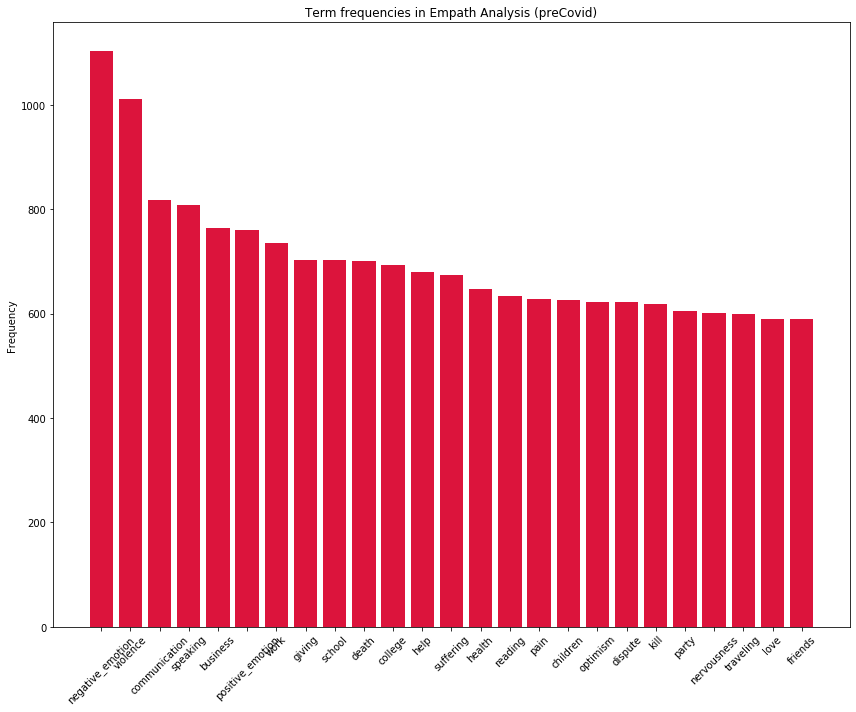

In [10]:
# pre
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(figsize = (12, 10))
y = []
x = []
for tag, count in counter_pre.most_common(25):
    y.append(count)
    x.append(tag)
plt.bar(x, y, color = "crimson")
plt.title("Term frequencies in Empath Analysis (preCovid)")
plt.ylabel("Frequency")
plt.xticks(rotation = 45)
plt.tight_layout()
plt.savefig("Term Frequency of Empath Before Covid.png")

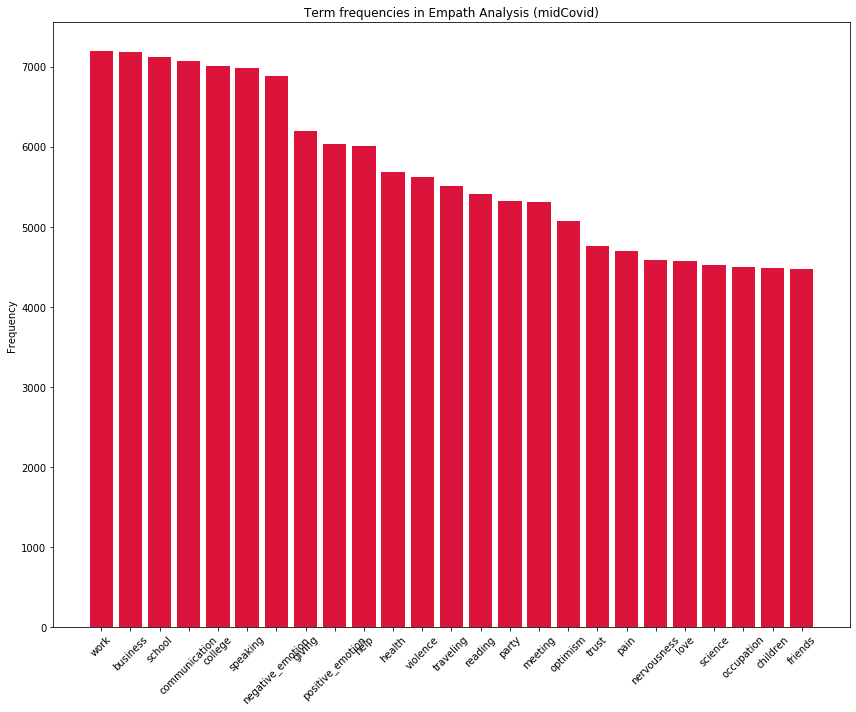

In [11]:
# mid
fig, ax = plt.subplots(figsize = (12, 10))
y = []
x = []
for tag, count in counter_mid.most_common(25):
    y.append(count)
    x.append(tag)
plt.bar(x, y, color = "crimson")
plt.title("Term frequencies in Empath Analysis (midCovid)")
plt.ylabel("Frequency")
plt.xticks(rotation = 45)
plt.tight_layout()
plt.savefig("Term Frequency of Empath During Covid.png")

# 7. Prepare Data for Visualization Team

In [44]:
########################
## Add Keyword Column ##
########################

# add contain_covid, contain_sg, contain_mental_health and relevancy columns
import re
keywords = []
mental_health_keywords = ["depression", "mental illness", "unalive", "social anxiety", "loneliness", "stress", "lonely", "isolation", "suicide",
                            "abuse", "death", "post traumatic stress disorder", "no motivation", "therapy", "trauma", "counselling", 
                            "mood disorder", "mood swings", "mental health", "angst", "emotion", "phobia", "addiction", "stigma", "self-harm",
                            "neurosis", "abuse", "disorder", "dependence", "socialize", "help", "dead", "melancholia", "dysthemia", "tired", 
                            "trapped", "paranoia", "overwhelmed", "irritable", "bipolar", "psychologist", "well-being", "imh", "sos", 
                            "counsellor", "toxic", "insominia", "drugs", "fight", "self-esteem"]
pandemic_keywords = ["covid-19", "pandemic", "restriction", "social distancing", "circuit breaker", "pre-covid", "coronavirus", "quarantine", 
                        "lockdown", "wfh", "tighter measures", "phase 2", "vaccine", "community cases", "epidemic", "mask", "asymptomatic",
                        "fatality rate", "clinical trial", "contact tracing", "contactless", "national emergency", "transmission", "screening", 
                        "testing", "hospital", "healthcare worker", "death", "symptomatic", "symptoms", "isolation", "safe distancing",
                        "physical distancing", "outbreak", "cluster", "spread", "hygiene", "crisis", "new normal", "uncertainty", "zoom", 
                        "retrenchment", "variant", "heightened alert", "stay home notice", "shn", "hbl", "safe entry", "home based learning",
                        "frontline", "school closure", "job insecurity"]

for rowIndex, row in df.iterrows():
    content = row["text"]
    original_content = row["original_text"]
    row_key = []
    for word in content.split():
        if word in mental_health_keywords:
            row_key.append(word)
        if word in pandemic_keywords:
            row_key.append(word)
    for word in original_content.split():
        if word in mental_health_keywords:
            row_key.append(word)
        if word in pandemic_keywords:
            row_key.append(word)
    if row_key == []:
        row_key = ""
    else:
        row_key = list(set(row_key))
    keywords.append(row_key)
df["keywords"] = keywords
df = df[df["keywords"] != ""]
df.head()

,id,subreddit,text,original_text,score,upvote_ratio,created_utc,clean subject matter,sentiment score,sentiment class,empath,empath_raw,keywords
0,nhxjoa,singapore,spore psychotic disorder say study,"About 71,600 in S'pore have psychotic disorder...",117,0.96,2021-05-22,disorder say study,-0.4019,neu,"[health, school, college, reading, speaking, s...","{'help': 0.0, 'office': 0.0, 'dance': 0.0, 'mo...",[disorder]
1,ng6k8b,askSingapore,anyone know get tested adult auditory disorder...,Anyone know where to get tested as an Adult fo...,8,0.84,2021-05-19,anyone know tested adult disorder know child n...,-0.4032,neu,"[help, office, dance, domestic_work, aggressio...","{'help': 0.015625, 'office': 0.010416666666666...","[stress, help, disorder]"
2,ksalf9,singapore,she even time grieve donor ask mum refund boy ...,'She didn't even have time to grieve': Some do...,202,0.94,2021-01-07,time donor ask mum refund boy disorder,-0.6486,neg,"[domestic_work, family, masculine, health, suf...","{'help': 0.0, 'office': 0.0, 'dance': 0.0, 'mo...",[disorder]
3,mfnwal,NationalServiceSG,help adjustment disorder people say half war r...,Help for adjustment disorder. People say half ...,5,0.86,2021-03-29,help adjustment disorder people say war report...,-0.5994,neg,"[help, office, wedding, sleep, medical_emergen...","{'help': 0.07692307692307693, 'office': 0.0769...","[help, disorder, imh]"
4,l0ac4u,askSingapore,get assessed eating disorder might eating diso...,Where to get assessed for eating disorders?. I...,42,1.00,2021-01-19,eating disorder eating disorder want eating ha...,-0.7003,neg,"[help, money, wedding, domestic_work, medical_...","{'help': 0.015267175572519083, 'office': 0.0, ...","[psychologist, disorder]"


In [ ]:
########################
## Export Correct CSV ##
########################

df = df[["id", "subreddit", "text", "original_text", "score", "upvote_ratio", "created_utc", "clean subject matter", 'sentiment score', "sentiment class", "empath", "keywords"]]
df.to_csv("C:\\Users\\20jam\\Documents\\GitHub\\omdena-singapore-covid-health\\src\\data\\reddit\\cutsom_data_for_viz.csv")